# Imports

In [1]:
# Import necessary libraries
import imageio
import numpy as np
import os
import matplotlib.pyplot as plt
from background_remover import *


# Path to the images
image_folder = "../../Data/Week2/qsd2_w2/"  # Update this path as necessary
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]
mask_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]
image_files.sort()
mask_files.sort()

# Func Principal

C:\Users\Adrià\AppData\Local\Temp\ipykernel_13428\3147981431.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(image_path)


[0 1]
[   0 1862]
00000.jpg -> Precision: 0.8382, Recall: 0.9998, F1: 0.9119


C:\Users\Adrià\AppData\Local\Temp\ipykernel_13428\3147981431.py:21: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt_raw = imageio.imread(gt_path)


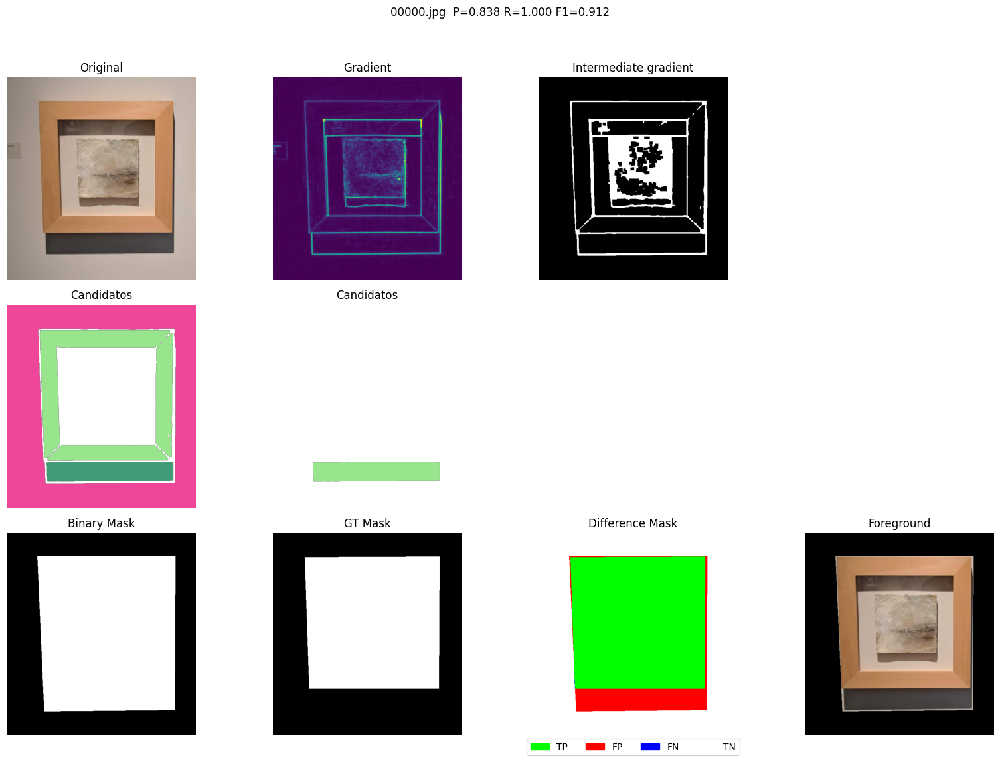

[0 1]
[0]
00001.jpg -> Precision: 0.9342, Recall: 1.0000, F1: 0.9660


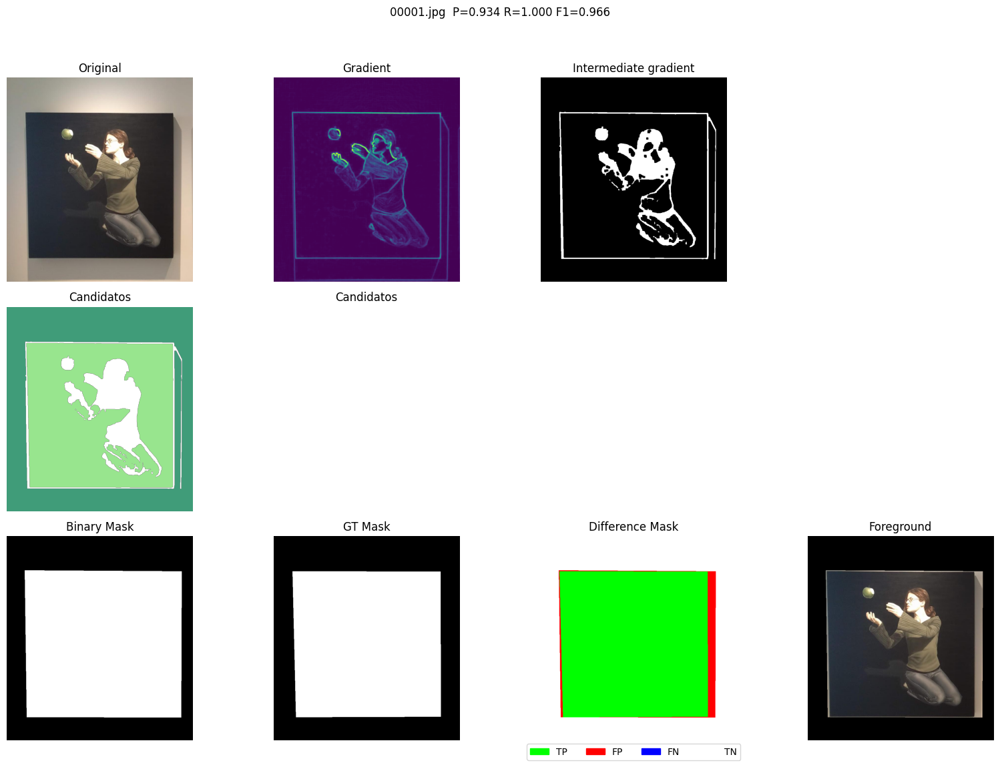

[0 1]
[   0 1634 1635]
00002.jpg -> Precision: 0.9133, Recall: 1.0000, F1: 0.9547


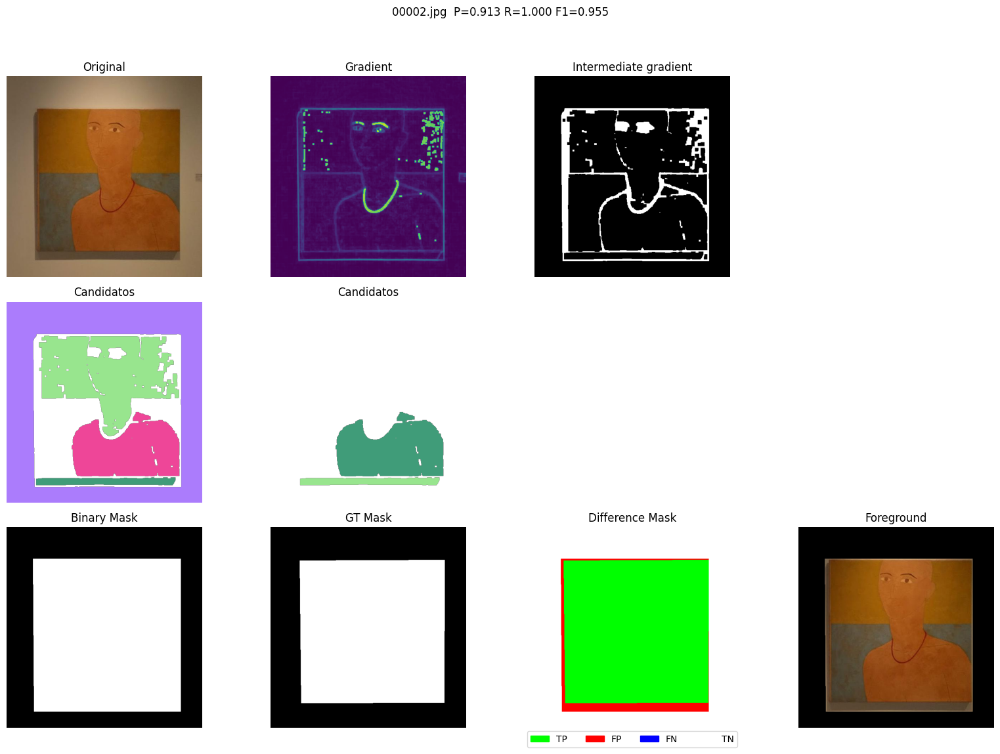

[0 1]
[   0 2613]
00003.jpg -> Precision: 0.8488, Recall: 1.0000, F1: 0.9182


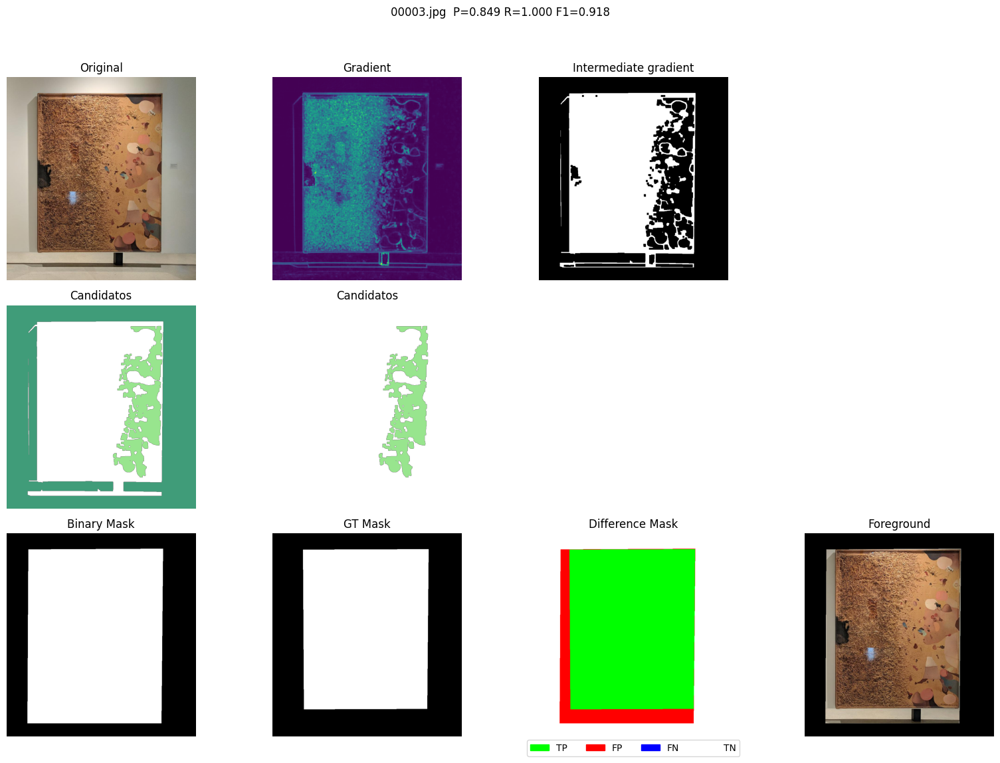

[0 1]
[   0  589 1103]
00004.jpg -> Precision: 0.8602, Recall: 1.0000, F1: 0.9248


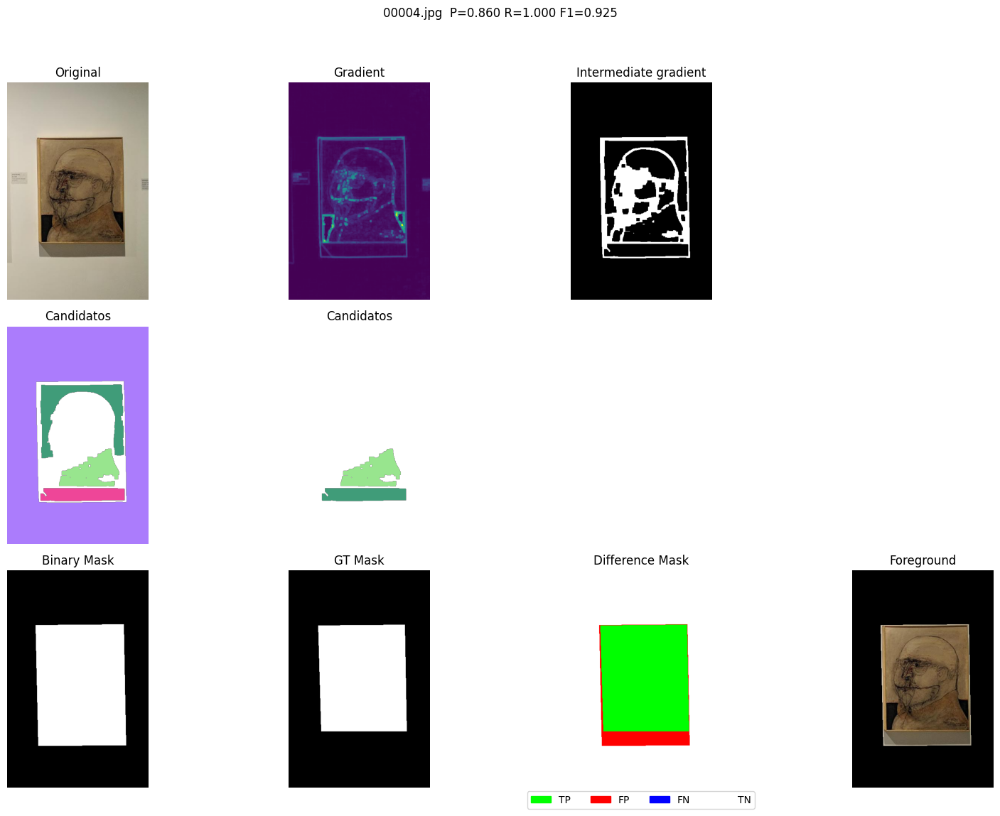

[0 1]
[   0  412 1674 4236 5712]
00005.jpg -> Precision: 0.9919, Recall: 0.9966, F1: 0.9942


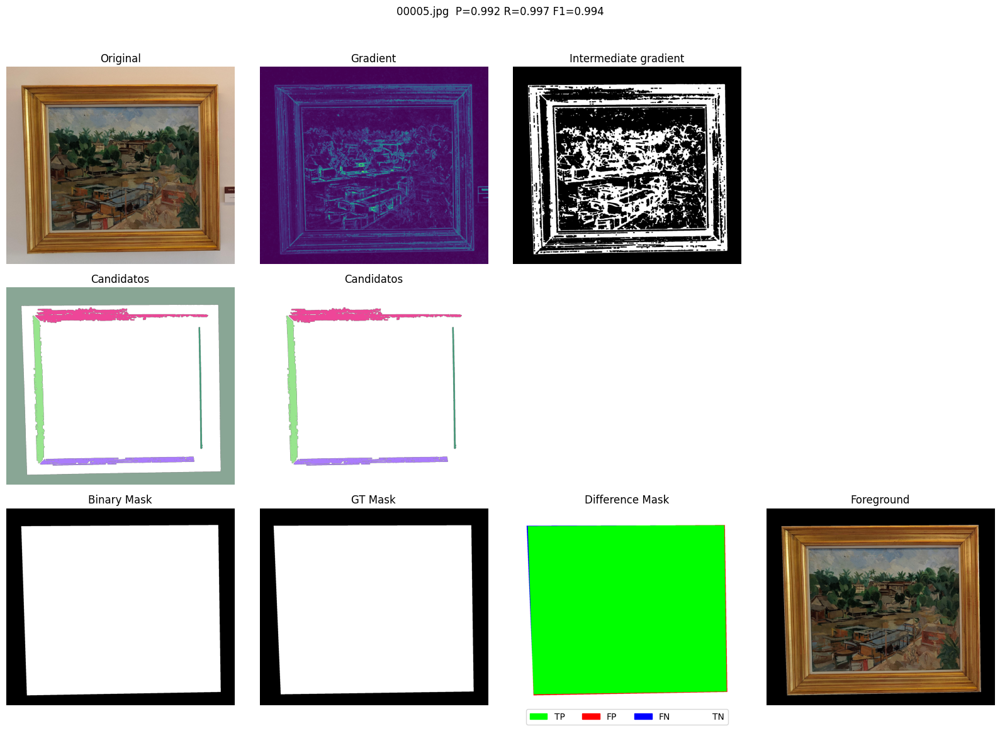

[0 1]
[   0 5227 6986]
00006.jpg -> Precision: 0.9932, Recall: 0.9995, F1: 0.9963


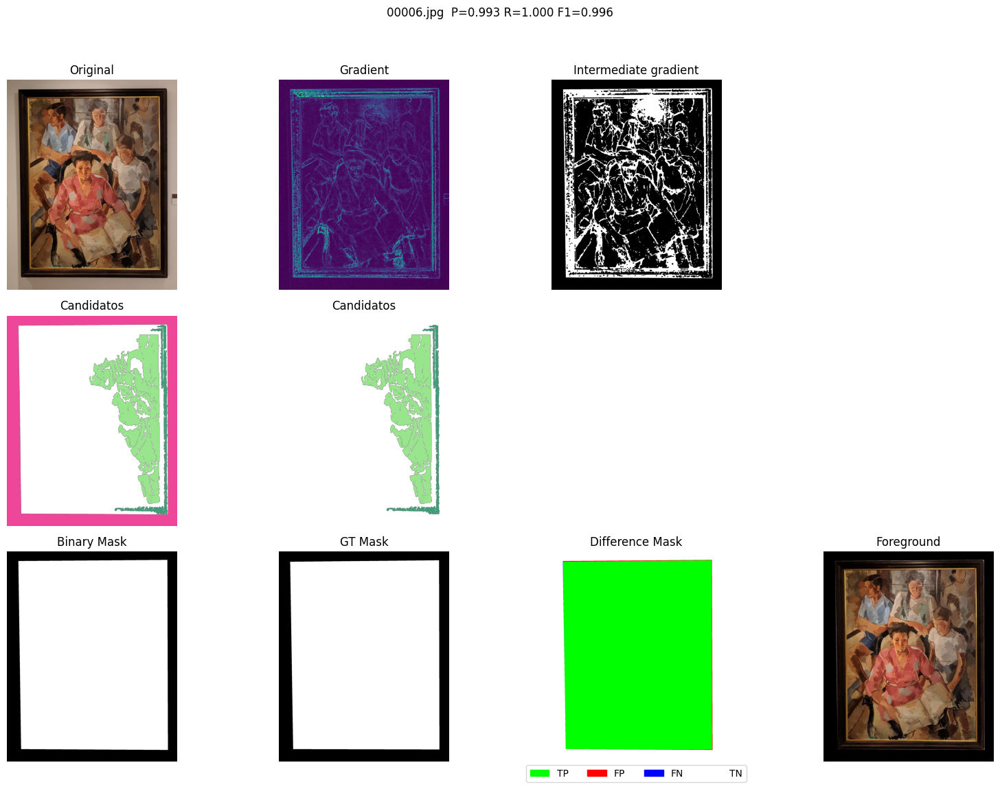

[0 1]
[   0 1690]
00007.jpg -> Precision: 0.8789, Recall: 1.0000, F1: 0.9355


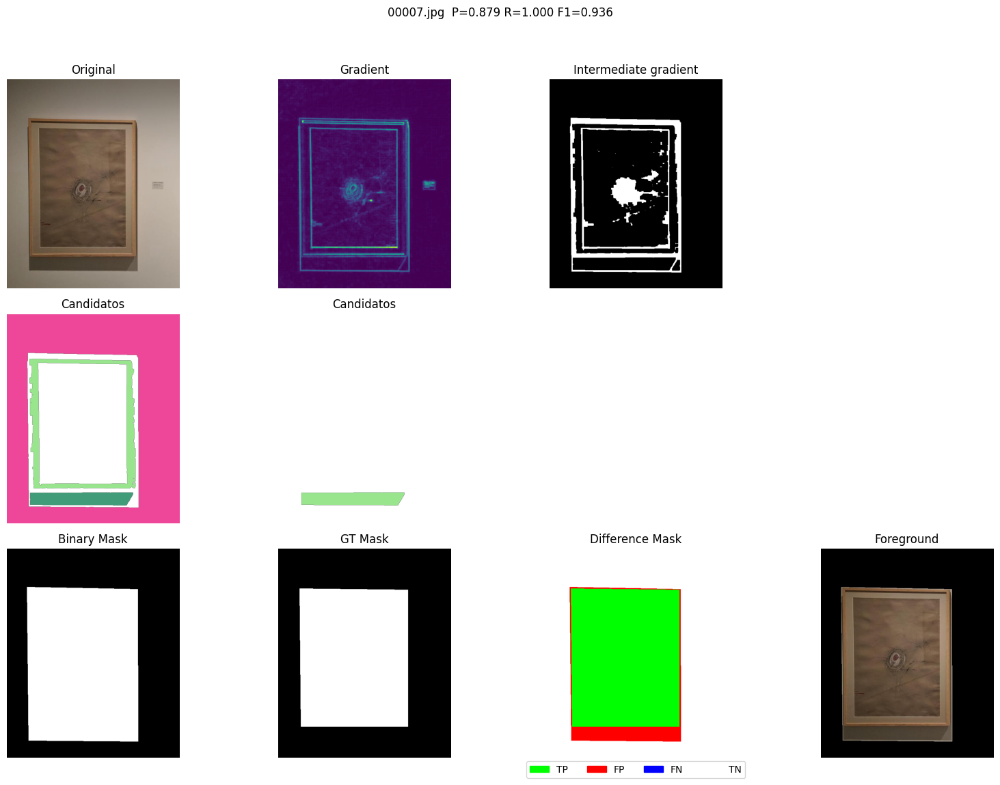

[0 1]
[   0  967 1385 1806]
00008.jpg -> Precision: 0.9449, Recall: 1.0000, F1: 0.9717


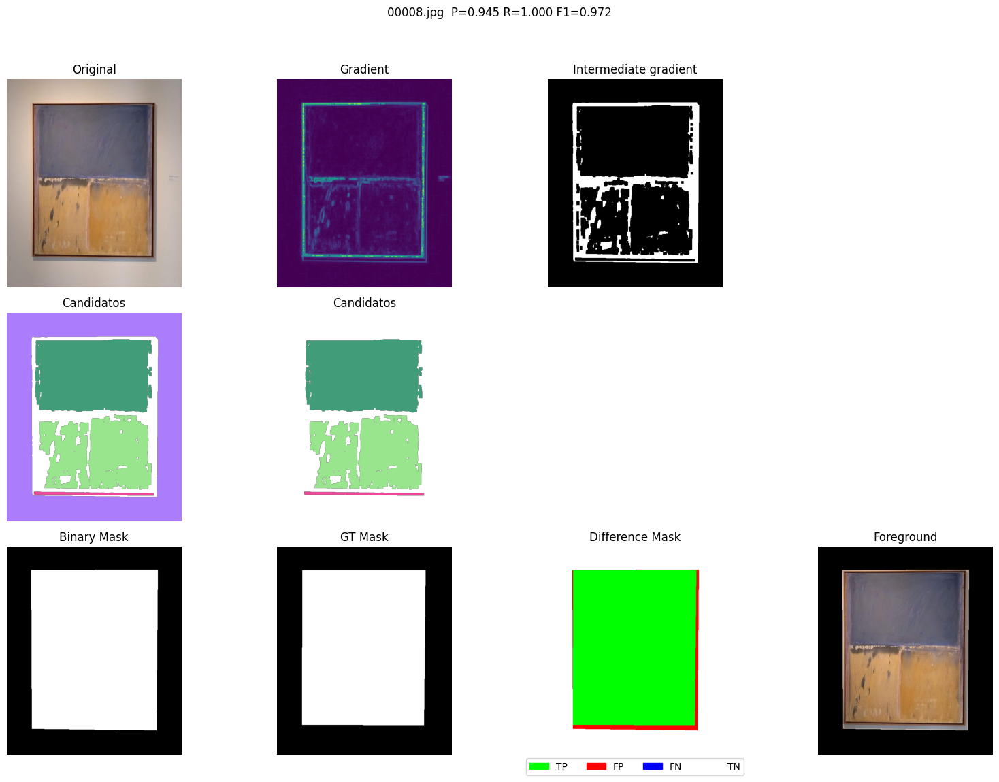

[0 1]
[0]
00009.jpg -> Precision: 0.8468, Recall: 0.9998, F1: 0.9170


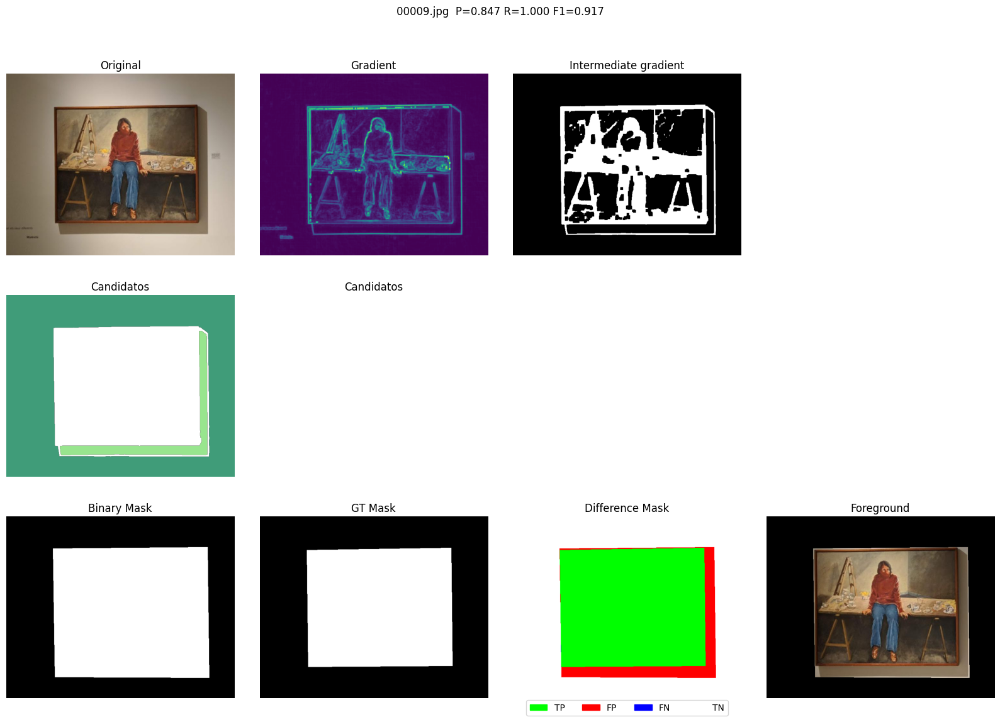

[0 1]
[0]
00010.jpg -> Precision: 0.9813, Recall: 0.9975, F1: 0.9893


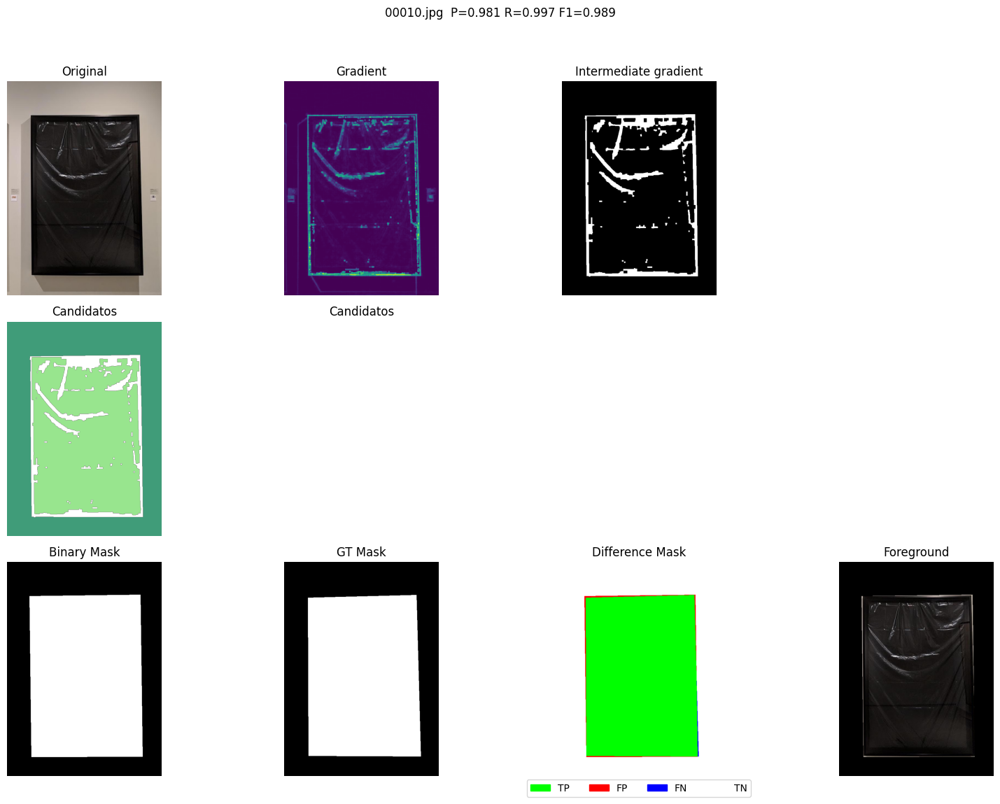

[0 1]
[   0 5501 6831]
00011.jpg -> Precision: 0.9933, Recall: 0.9973, F1: 0.9953


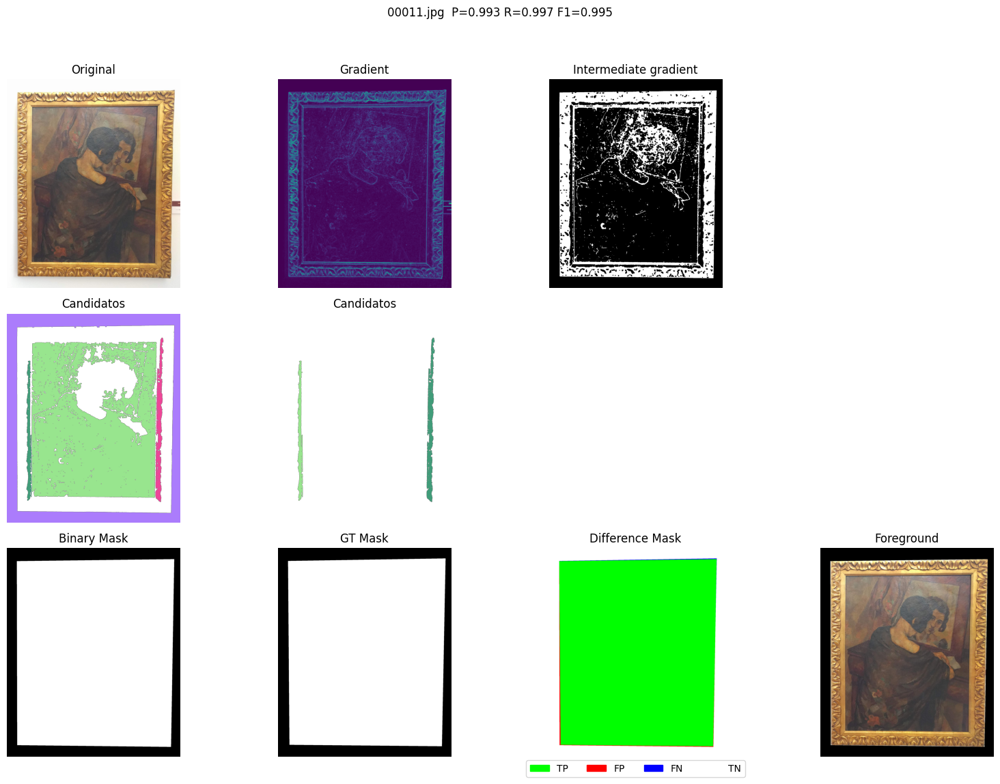

[0 1]
[   0 5234 5475]
00012.jpg -> Precision: 0.9931, Recall: 0.9982, F1: 0.9956


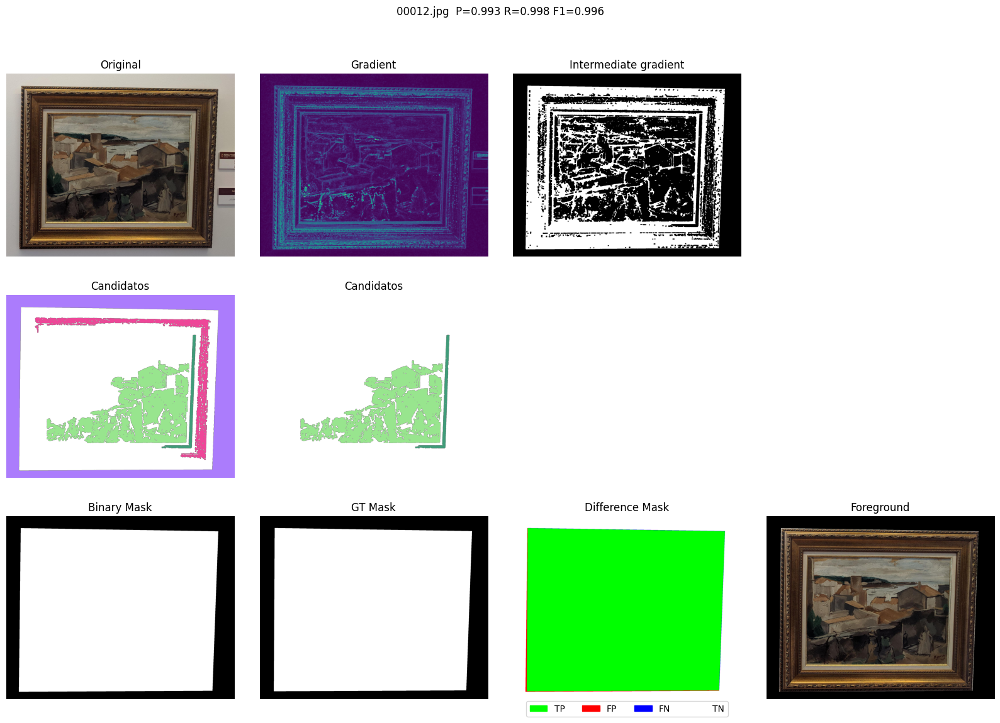

[0 1]
[0]
00013.jpg -> Precision: 0.9125, Recall: 1.0000, F1: 0.9543


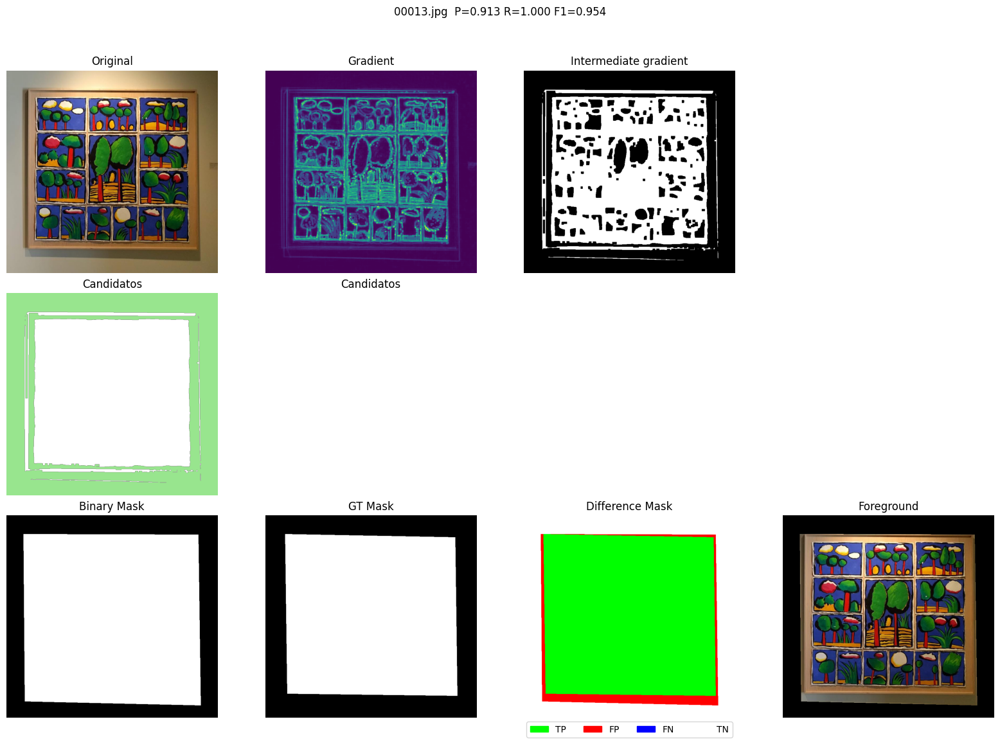

[0 1]
[   0 1676]
00014.jpg -> Precision: 0.8093, Recall: 1.0000, F1: 0.8946


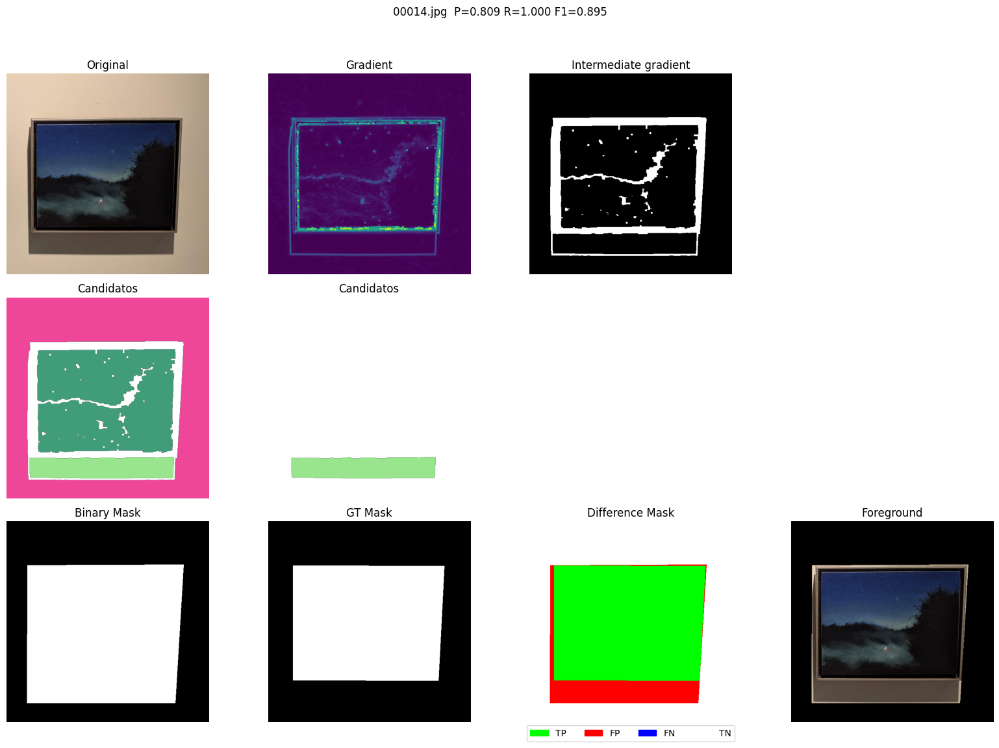

[0 1]
[   0 4409]
00015.jpg -> Precision: 0.9363, Recall: 0.9770, F1: 0.9562


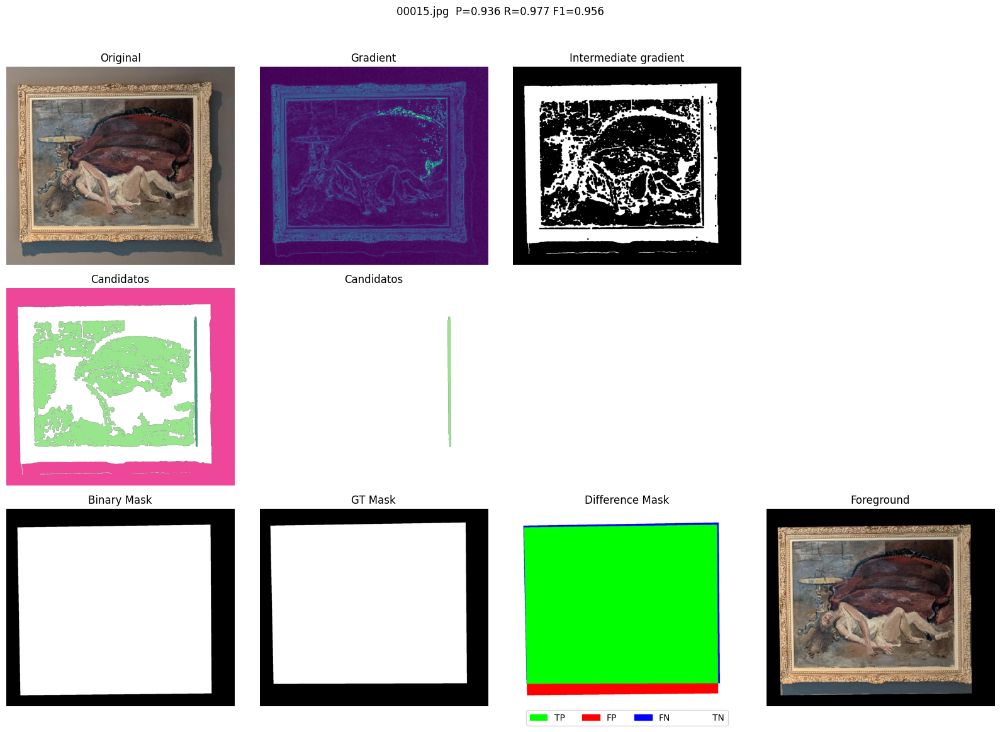

[0 1]
[   0 3610 5720]
00016.jpg -> Precision: 0.9980, Recall: 0.9976, F1: 0.9978


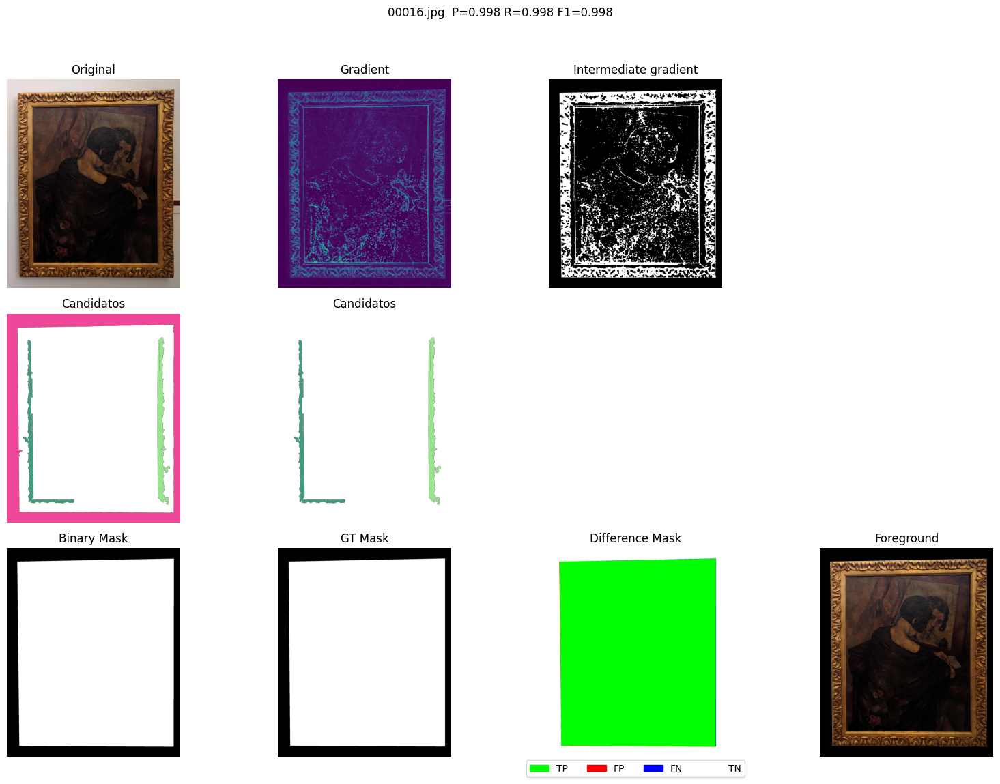

[0 1]
[0]
00017.jpg -> Precision: 0.9993, Recall: 0.9901, F1: 0.9947


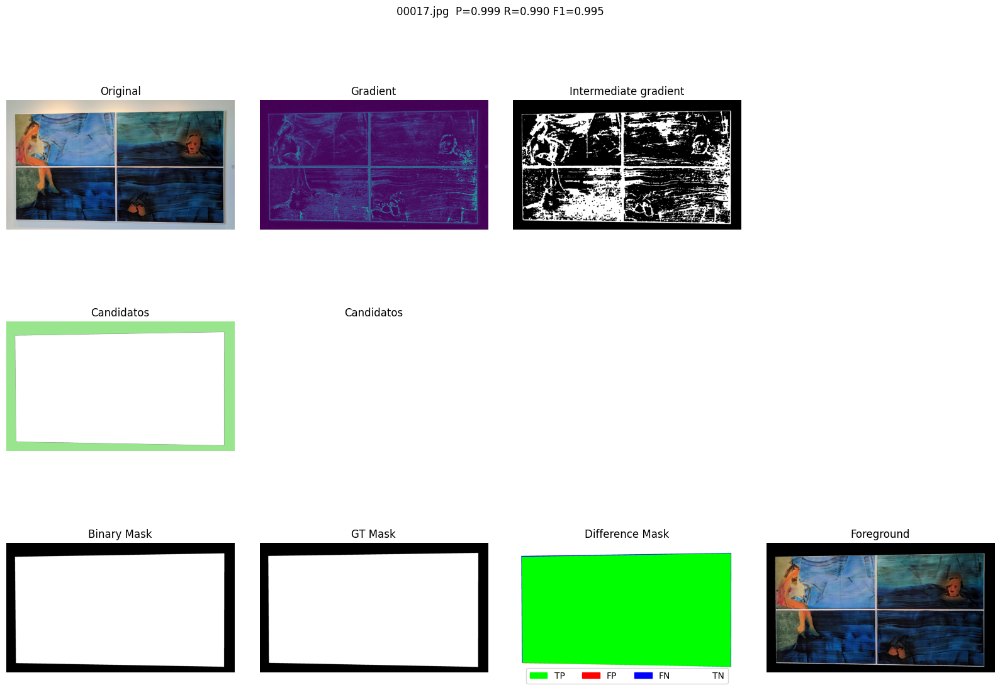

[0 1]
[   0 1097 2490]
00018.jpg -> Precision: 0.9184, Recall: 1.0000, F1: 0.9575


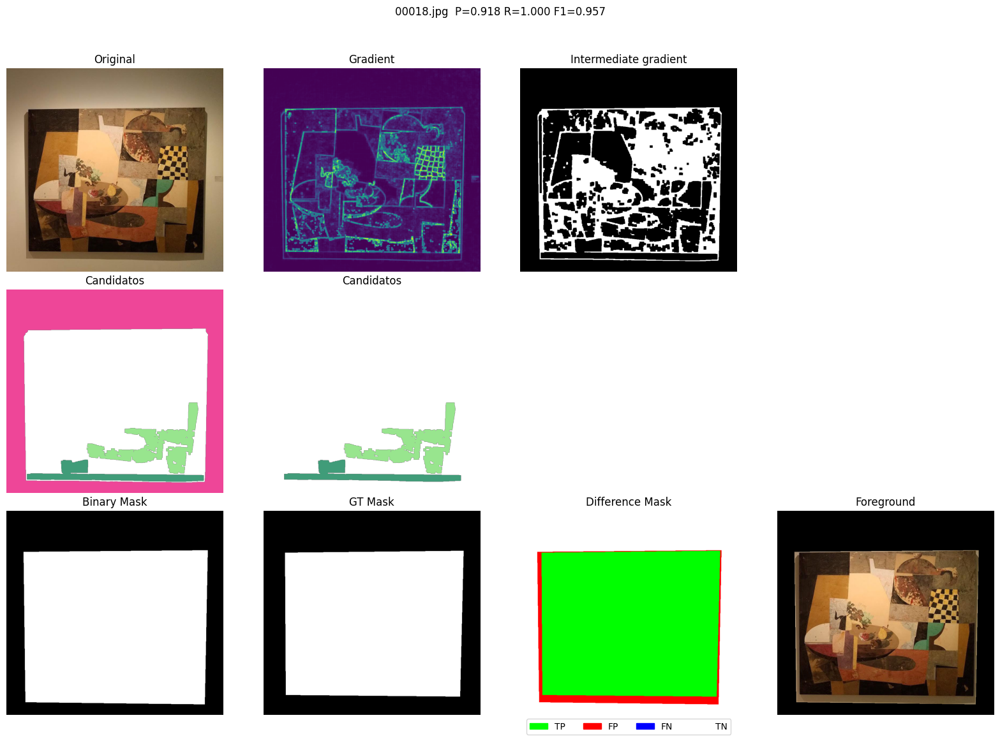

[0 1]
[   0  629 1737 2423]
00019.jpg -> Precision: 0.9501, Recall: 1.0000, F1: 0.9744


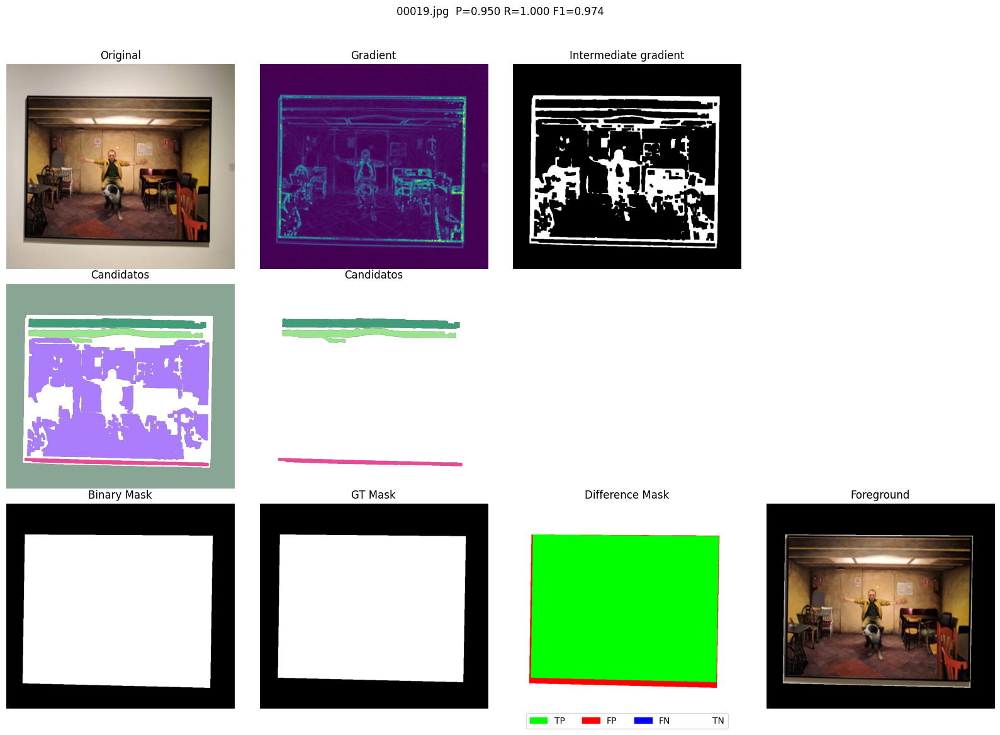

[0 1]
[   0 1224 2619]
00020.jpg -> Precision: 0.9608, Recall: 0.9989, F1: 0.9795


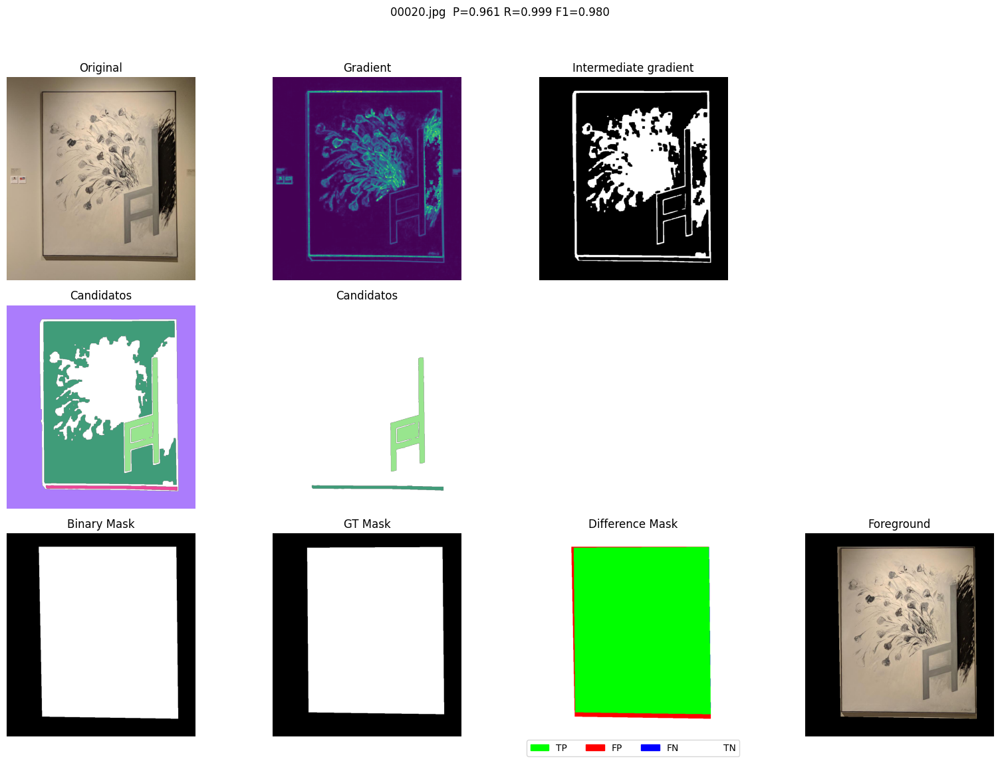

[0 1]
[   0 1538 2014]
00021.jpg -> Precision: 0.9174, Recall: 1.0000, F1: 0.9569


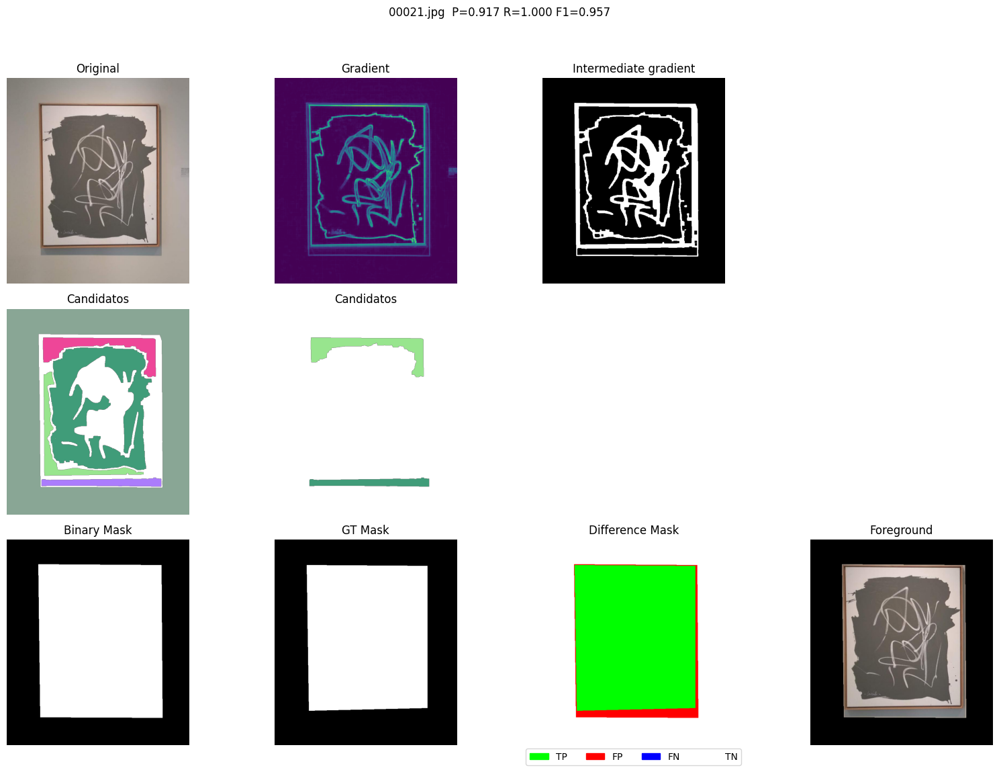

[0 1]
[0]
00022.jpg -> Precision: 0.8842, Recall: 1.0000, F1: 0.9385


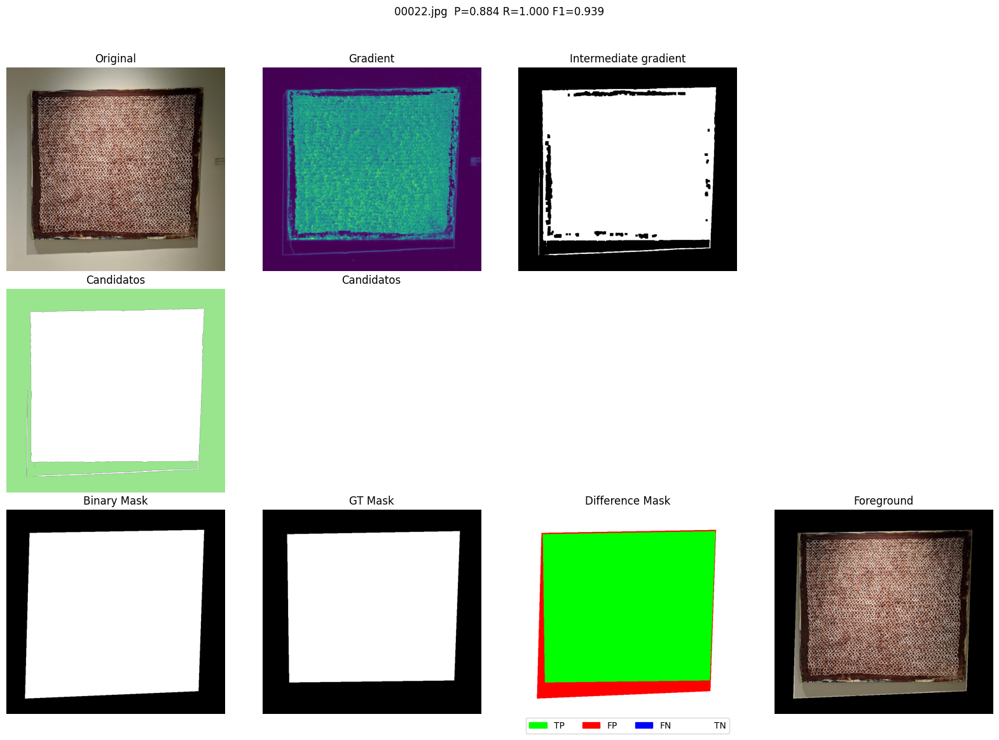

[0 1]
[  0 264]
00023.jpg -> Precision: 0.9918, Recall: 0.9982, F1: 0.9950


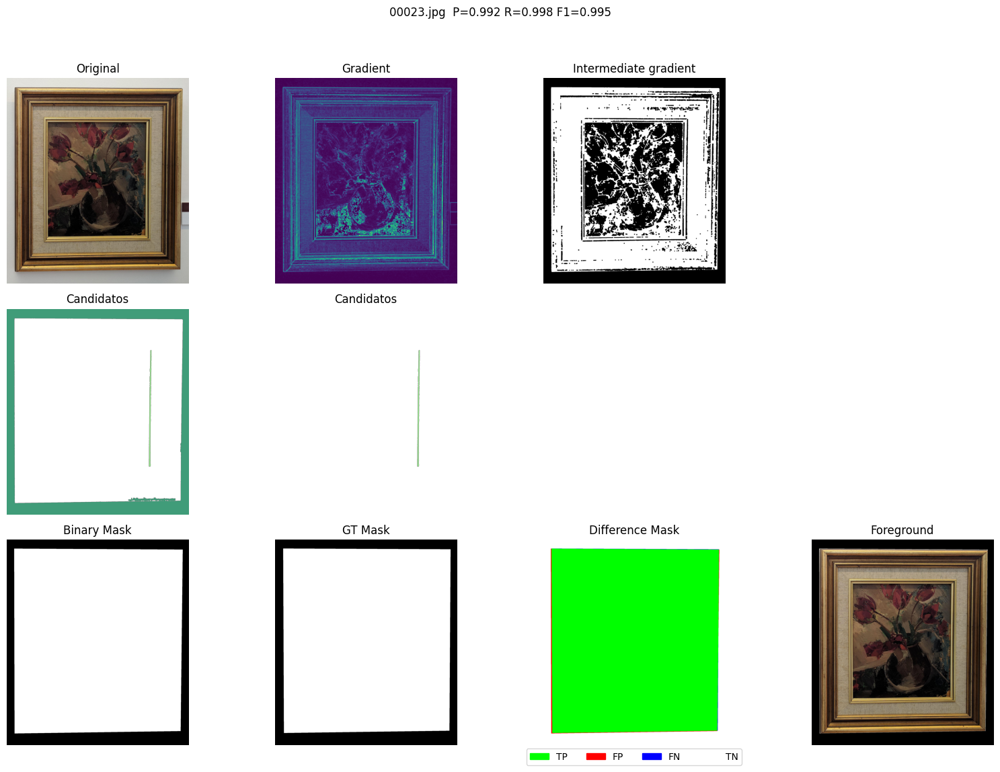

[0 1]
[   0 2365]
00024.jpg -> Precision: 0.9317, Recall: 1.0000, F1: 0.9647


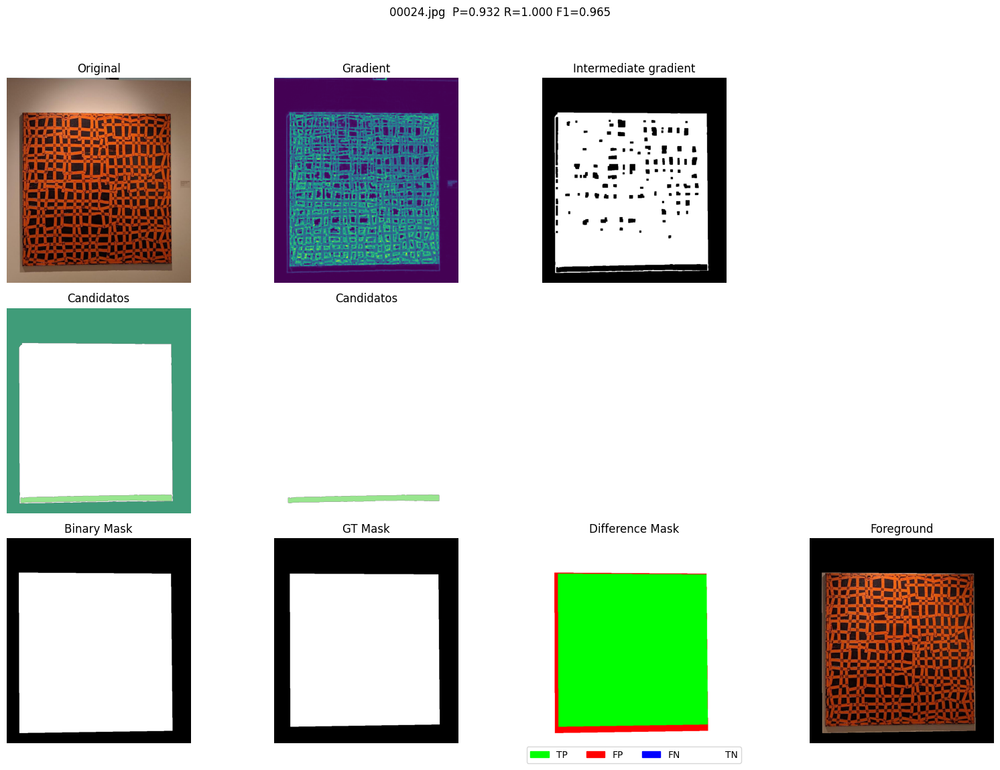

[0 1]
[0]
00025.jpg -> Precision: 0.9743, Recall: 0.9683, F1: 0.9713


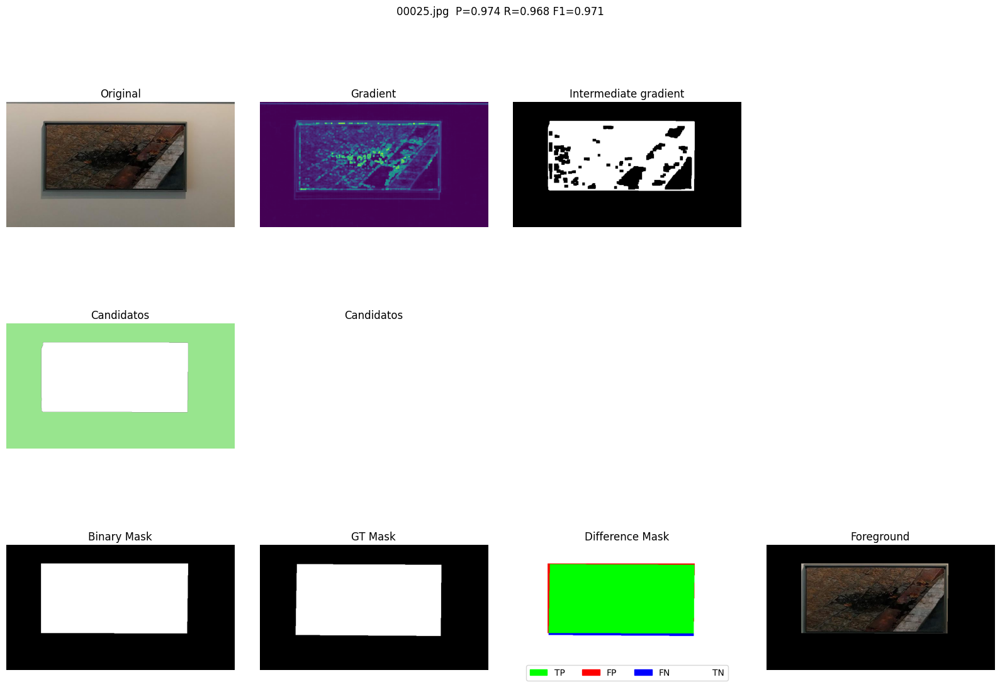

[0 1]
[   0  808 1056]
00026.jpg -> Precision: 0.8957, Recall: 1.0000, F1: 0.9450


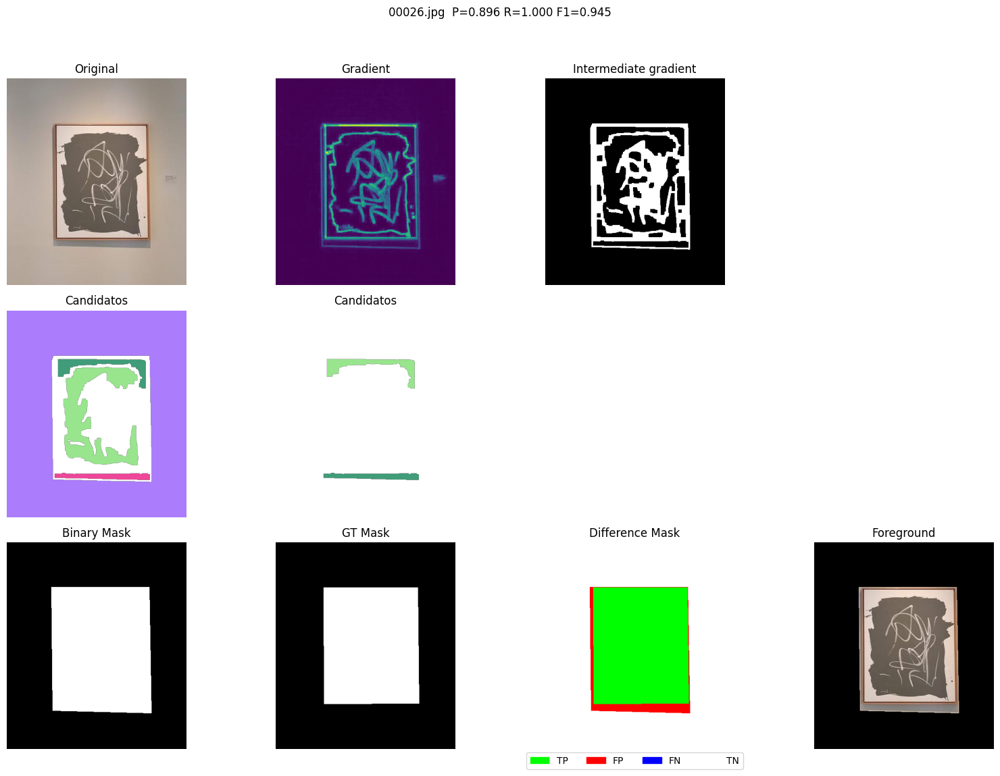

[0 1]
[   0 1606]
00027.jpg -> Precision: 0.8997, Recall: 1.0000, F1: 0.9472


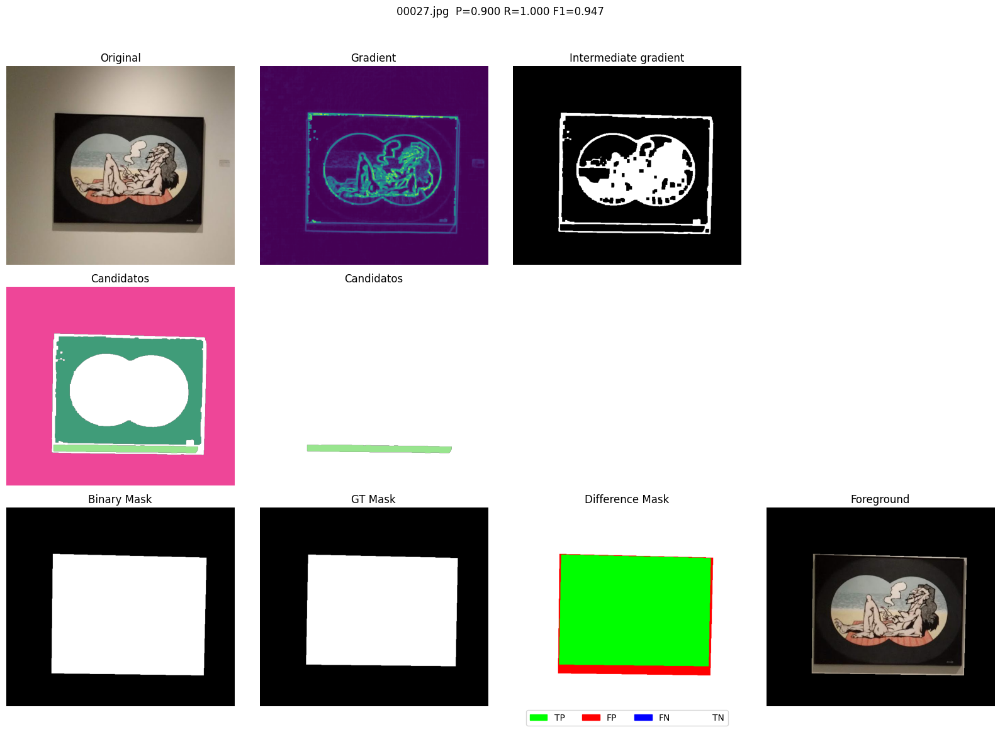

[0 1]
[   0 2182]
00028.jpg -> Precision: 0.9278, Recall: 0.9921, F1: 0.9588


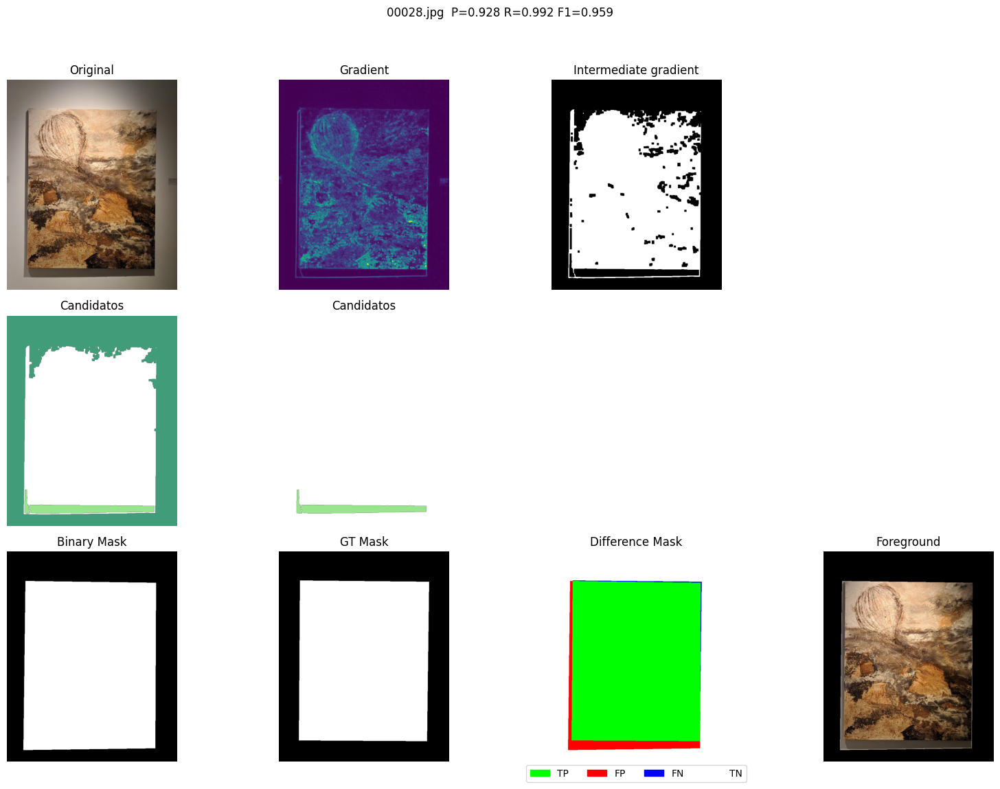

[0 1]
[   0 1340]
00029.jpg -> Precision: 0.9077, Recall: 1.0000, F1: 0.9516


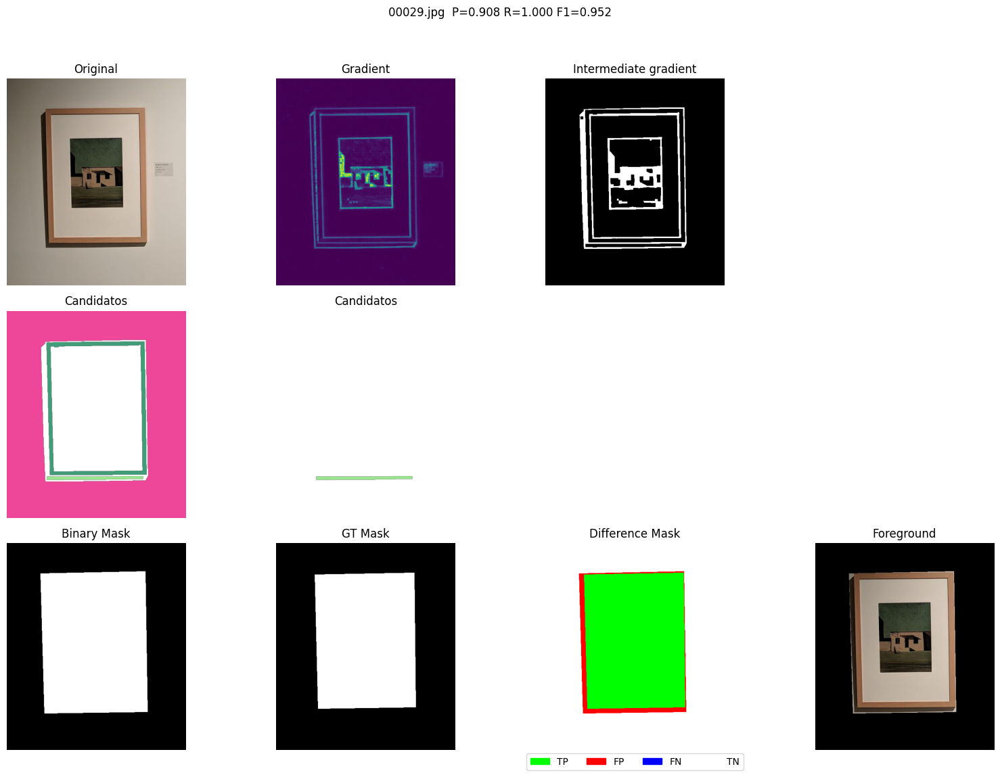


=== Global pixel-wise metrics ===
Precision: 0.9278 | Recall: 0.9970 | F1: 0.9603


In [2]:
# Iterar sobre imágenes, comparar con GT, calcular métricas y mostrar resultados
import matplotlib.patches as mpatches

# Toggle plotting of images. Set to False to speed-up and only print metrics.
SHOW_PLOTS = True

precisions = []
recalls = []
f1s = []

for idx, image_file in enumerate(image_files):
    image_path = os.path.join(image_folder, image_file)
    im = imageio.imread(image_path)
    # Now the function returns the gradient as grad_norm (2D uint8) instead of using a global debug list
    original_image, pred_mask, foreground, grad_norm, gn, sc, sc2 = remove_background_morphological_gradient(im)

    pred_bool = pred_mask.astype(bool)

    base = os.path.splitext(image_file)[0]
    gt_path = os.path.join(image_folder, base + '.png')
    gt_raw = imageio.imread(gt_path)
    gt_bool = gt_raw > 127

    # Calcular TP, FP, FN, TN (por píxel)
    TP = np.logical_and(pred_bool, gt_bool).sum()
    FP = np.logical_and(pred_bool, np.logical_not(gt_bool)).sum()
    FN = np.logical_and(np.logical_not(pred_bool), gt_bool).sum()
    TN = np.logical_and(np.logical_not(pred_bool), np.logical_not(gt_bool)).sum()

    # Precision, Recall, F1 para la imagen
    P = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    R = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    F1 = 2 * P * R / (P + R) if (P + R) > 0 else 0.0

    precisions.append(P)
    recalls.append(R)
    f1s.append(F1)

    print(f"{image_file} -> Precision: {P:.4f}, Recall: {R:.4f}, F1: {F1:.4f}")

    # If plotting is disabled, skip constructing and showing figures
    if not SHOW_PLOTS:
        continue

    # Create image of difference coloured (TP=green, FP=red, FN=blue, TN=white)
    h, w = pred_bool.shape
    diff_rgb = np.zeros((h, w, 3), dtype=np.uint8)
    diff_rgb[np.logical_and(pred_bool, gt_bool)] = [0, 255, 0]     # TP verde
    diff_rgb[np.logical_and(pred_bool, np.logical_not(gt_bool))] = [255, 0, 0]  # FP rojo
    diff_rgb[np.logical_and(np.logical_not(pred_bool), gt_bool)] = [0, 0, 255]  # FN azul
    diff_rgb[np.logical_and(np.logical_not(pred_bool), np.logical_not(gt_bool))] = [255, 255, 255]  # TN blanco

    # Prepare gradient RGB for display (stack single-channel to 3)
    grad_rgb = np.stack([grad_norm, grad_norm, grad_norm], axis=-1)

    # Mostrar: Original | Gradient | Binary Mask | GT Mask | Difference Mask | Foreground
    plt.figure(figsize=(16, 12))

    plt.subplot(3, 4, 1)
    plt.title('Original')
    plt.imshow(original_image)
    plt.axis('off')

    plt.subplot(3, 4, 2)
    plt.title('Gradient')
    plt.imshow(grad_norm, cmap='viridis')
    plt.axis('off')

    """
    cmap = plt.cm.get_cmap('nipy_spectral').copy()
    cmap.set_under('none')  # píxeles < vmin se ven transparentes
    plt.subplot(3, 4, 3)
    plt.title('Watershed Original')
    plt.imshow(ocrgb, cmap=cmap, vmin=1)
    plt.axis('off')

    
    plt.subplot(3, 4, 4)
    plt.title('Watershed')
    plt.imshow(crgb, cmap=cmap, vmin=1)
    plt.axis('off')"""


    plt.subplot(3, 4, 6)
    plt.title('Candidatos')
    plt.imshow(sc)
    plt.axis('off')

    plt.subplot(3, 4, 3)
    plt.title('Intermediate gradient')
    plt.imshow(gn, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 4, 5)
    plt.title('Candidatos')
    plt.imshow(sc2)
    plt.axis('off')


    plt.subplot(3, 4, 9)
    plt.title('Binary Mask')
    plt.imshow(pred_bool, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 4, 10)
    plt.title('GT Mask')
    plt.imshow(gt_bool, cmap='gray')
    plt.axis('off')
    

    plt.subplot(3, 4, 11)
    plt.title('Difference Mask')
    plt.imshow(diff_rgb)
    plt.axis('off')

    # Leyenda para Difference Mask
    patches = [
        mpatches.Patch(color=(0, 1, 0), label='TP'),
        mpatches.Patch(color=(1, 0, 0), label='FP'),
        mpatches.Patch(color=(0, 0, 1), label='FN'),
        mpatches.Patch(color=(1, 1, 1), label='TN')
    ]
    plt.legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.12), ncol=4)

    plt.subplot(3, 4, 12)
    plt.title('Foreground')
    plt.imshow(foreground)
    plt.axis('off')

    plt.suptitle(f"{image_file}  P={P:.3f} R={R:.3f} F1={F1:.3f}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    output_folder = os.path.join("outputs")
    os.makedirs(output_folder, exist_ok=True)

    # Guardar la figura
    output_path = os.path.join(output_folder, base + "_results.png")
    plt.savefig(output_path, dpi=150, bbox_inches='tight')

    plt.show()


global_precision = np.mean(precisions)
global_recall = np.mean(recalls)
global_f1 = np.mean(f1s)

print('\n=== Global pixel-wise metrics ===')
print(f'Precision: {global_precision:.4f} | Recall: {global_recall:.4f} | F1: {global_f1:.4f}')